# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from Kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications, we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

*The task we face is the development of predictive modeling and feature selection based on an available data set of used car sales prices.  More specifically, the aim is to develop a regression model where the target variable is the used car price, and potential predictor variables (features) include the remaining characterics of those used cars, likely including factors such as vehicle model year, mileage, make/model, condition, and the like.*

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

*Step 1: Load vehicles.csv and report out very basic information about the shape and structure of the data.*

*Step 2: Form a preliminary understanding of missing values and potential outliers.*

*Step 3: Dig in to non-numeric data and visualize distribution of numeric data to look for outliers.*

*(Please see code and output below, under DATA UNDERSTANDING section.)*

### Data Preparation

After our initial exploration and fine-tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

*Let's first decide which columns to drop.  ID and VIN are unlikely to yield useful information.  Region and model have many, many values.  Size has many missing values and seems duplicative of type.  We will drop these columns.*

*Price has some suspiciously low and high values, so let's focus on cars \\$5,000 - \\$100,000. Odometer as well, so let's drop anything over 200,000 miles.  Year has some suspiciously low values, so drop anything below 1990.*

*Let's make a further decision, this time a substantive one.  Let's remove high-luxury models and focus on cars an average (even a wealthy average) used car consumer is likely to buy.  These models are skewing the data (especially Ferrari).  This knocks out Ferrari, Aston Martin, Porsche.  And let's remove Harley-Davidson, to focus on cars instead of motorcycles.*

*Let's now drop anything with missing values and see how many records we are left with.  The result is over 80,000 records.  Let's proceed with that, but later let's check what would have happened if we had filled missing values with median/mode, using commented-out code.  One-shot encode all categorical columns and StandardScale all numerical columns.*

*We are now ready for modeling.*

*(Please see code and output below, under DATA PREPARATION section.)*

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

*First, let's establish a loop to run through standard regression models, testing each model with GridSearchCV to optimize hyperparameters.  That suggests Random Forest is the best model, with strong RMSE, MAE, and R².   RMSE measures absolute error between predicted and actual prices.  MAE is similar to RMSE but treats all errors equally, without extra weight on large errors (so it is less sensitive to outliers).  R² is a measures how much variance in price is explained by the features. Each of these measures is instructive, and it is not necessary to chose among them here, as each points in favor of Random Forest on this data as prepared. As a double-check, it also performed well on the cross-validation (CV) R², indicating that we are not over-fitting. It looks like the most influential features are Year, Odometer, Cylinders, Fuel, Drive, and Condition.*

*Now let's try generating polynomial features, and apply the best such features using SelectFromModel so as to avoid overfitting.  The results take awhile to run, and did not substantially improve RMSE, R², or CV R².*

*Now let's try uncommenting the line of code we inserted at one point in the Data Preparation workflow.  Recall that we dropped many cars due to missing values. Let's see what happens if we don't drop those cars but instead replace the missing values when modes and medians.  Instead of ~80k cars, we'll be working with ~305k cars. Not surprisingly (given we've added >200k of missing values), the fit goes down for each model. Let's change back to removing the records with missing values.*

*(Please see code and output below, under MODELING section.)*

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high-quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight into drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

*We now have a high quality Random Forest model to predict the price at which a used car will sell.  The model suggests that the factors we should pay the most attention to are Year, Odometer, Cylinders, Fuel, Drive, and Condition, in that order.  Those factors align well with common sense, as when one thinks of "depreciation" (i.e., a reduction in car price), age and mileage are typically what one refers to.*

*As a final step before presenting the data, let's drill down on a particular subset of the data, to show what further analysis we might be able to do for our audience once they have seen the initial results.  For example, let's focus on selling trucks in California.*

*(Please see code and output below, under MODELING section.)*

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine-tuning their inventory.

*Please see PRESENTATION section at bottom of page*

### Data Understanding - CODE AND OUTPUT

In [150]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import seaborn as sns

# Load the dataset
file_path = "vehicles.csv"
df = pd.read_csv(file_path)

# Display basic structure
print("STEP 1 -- Dataset Overview:\n")
print("Shape:", df.shape)  # Number of rows and columns
print("\nColumn Names:", df.columns.tolist())  # List of column names

# Display the first few rows
print("\nFirst 5 Rows:\n")
print(df.head())

STEP 1 -- Dataset Overview:

Shape: (426880, 18)

Column Names: ['id', 'region', 'price', 'year', 'manufacturer', 'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status', 'transmission', 'VIN', 'drive', 'size', 'type', 'paint_color', 'state']

First 5 Rows:

           id                  region  price  year manufacturer model  \
0  7222695916                prescott   6000   NaN          NaN   NaN   
1  7218891961            fayetteville  11900   NaN          NaN   NaN   
2  7221797935            florida keys  21000   NaN          NaN   NaN   
3  7222270760  worcester / central MA   1500   NaN          NaN   NaN   
4  7210384030              greensboro   4900   NaN          NaN   NaN   

  condition cylinders fuel  odometer title_status transmission  VIN drive  \
0       NaN       NaN  NaN       NaN          NaN          NaN  NaN   NaN   
1       NaN       NaN  NaN       NaN          NaN          NaN  NaN   NaN   
2       NaN       NaN  NaN       NaN          NaN        

In [152]:
print("STEP 2 -- Missing Values and Value Ranges:\n")

# Display data types and missing values
print("\nColumn Data Types and Missing Values:\n")
print(df.info())

# Summary statistics for numerical columns
print("\nSummary Statistics:\n")
pd.options.display.float_format = '{:.0f}'.format
print(df.describe())

# Identify outliers in numeric columns using IQR method
print("\nOutliers in Numeric Columns:\n")
for column in df.select_dtypes(include=['number']).columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR))]
    print(f"{column}: {outliers.shape[0]} outliers detected")

STEP 2 -- Missing Values and Value Ranges:


Column Data Types and Missing Values:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_co

STEP 3 -- Explore non-numeric data, look for outliers and possible errors:


Unique Values for Non-Numeric Columns:

region: ['prescott' 'fayetteville' 'florida keys' 'worcester / central MA'
 'greensboro' 'hudson valley' 'medford-ashland' 'erie' 'el paso'
 'bellingham'] ... (404 unique values)
manufacturer: [nan 'gmc' 'chevrolet' 'toyota' 'ford' 'jeep' 'nissan' 'ram' 'mazda'
 'cadillac'] ... (43 unique values)
model: [nan 'sierra 1500 crew cab slt' 'silverado 1500' 'silverado 1500 crew'
 'tundra double cab sr' 'f-150 xlt' 'sierra 2500 hd extended cab'
 'silverado 1500 double' 'tacoma' 'colorado extended cab'] ... (29650 unique values)
condition: [nan 'good' 'excellent' 'fair' 'like new' 'new' 'salvage'] ... (7 unique values)
cylinders: [nan '8 cylinders' '6 cylinders' '4 cylinders' '5 cylinders' 'other'
 '3 cylinders' '10 cylinders' '12 cylinders'] ... (9 unique values)
fuel: [nan 'gas' 'other' 'diesel' 'hybrid' 'electric'] ... (6 unique values)
title_status: [nan 'clean' 'rebuilt' 'l

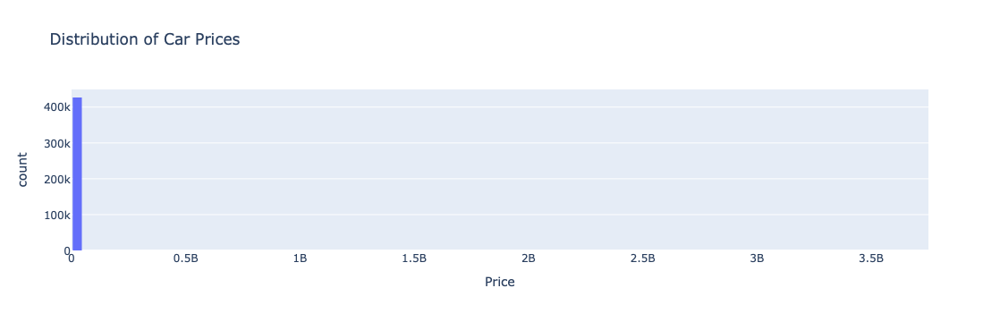

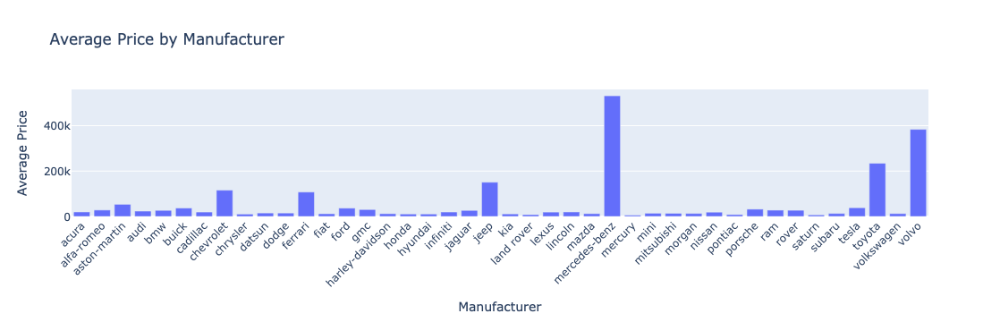

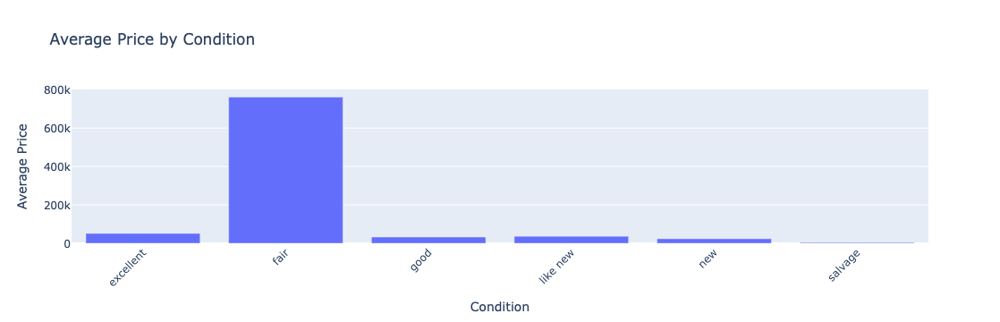

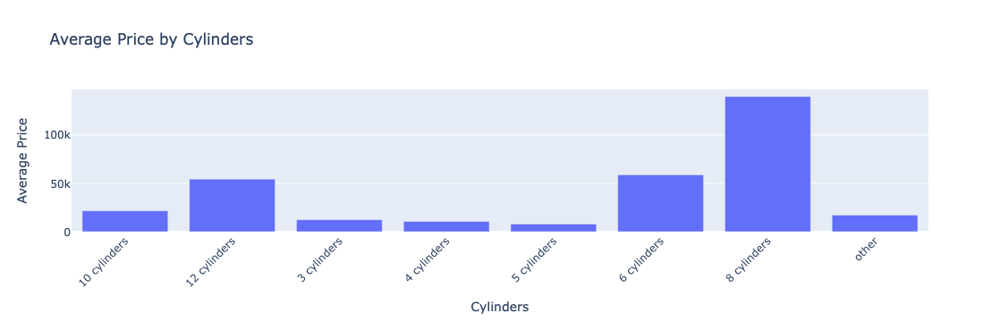

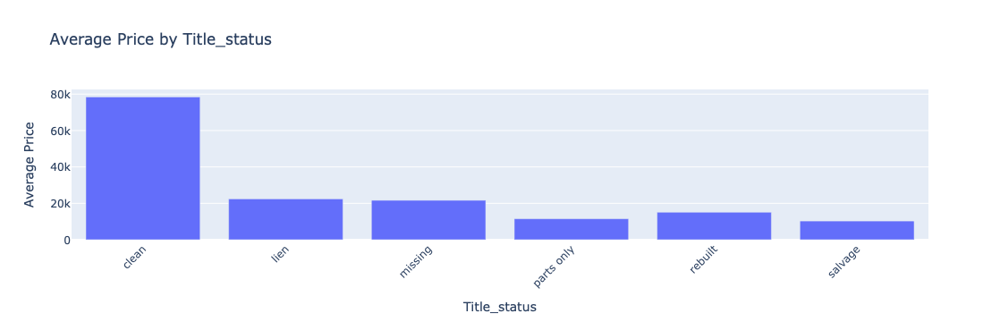

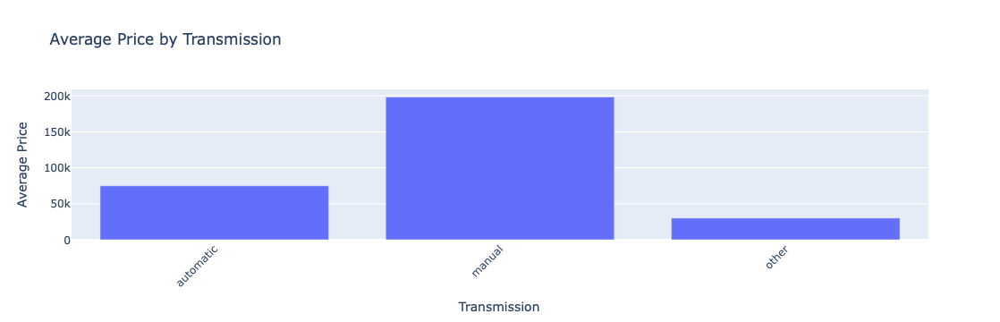

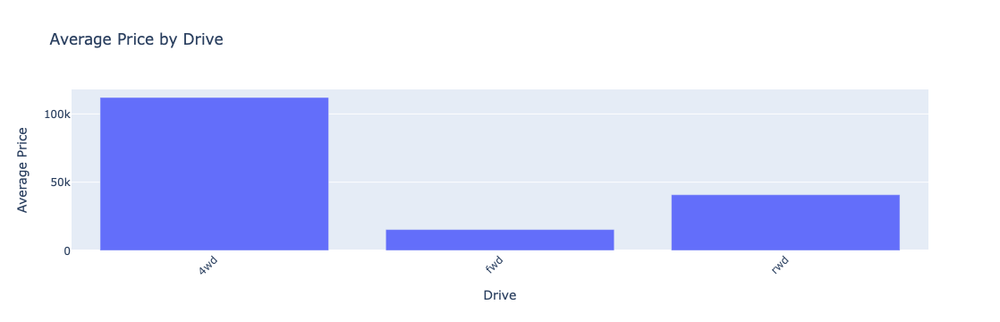

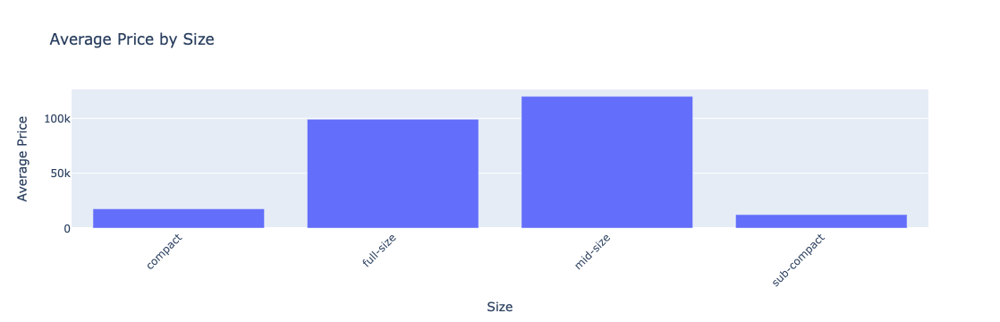

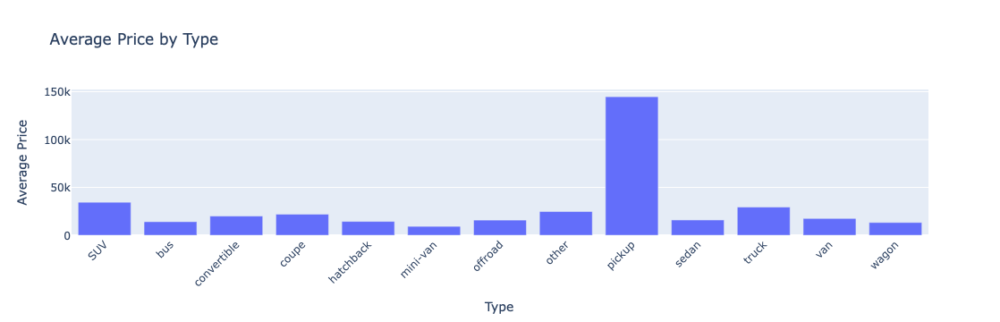

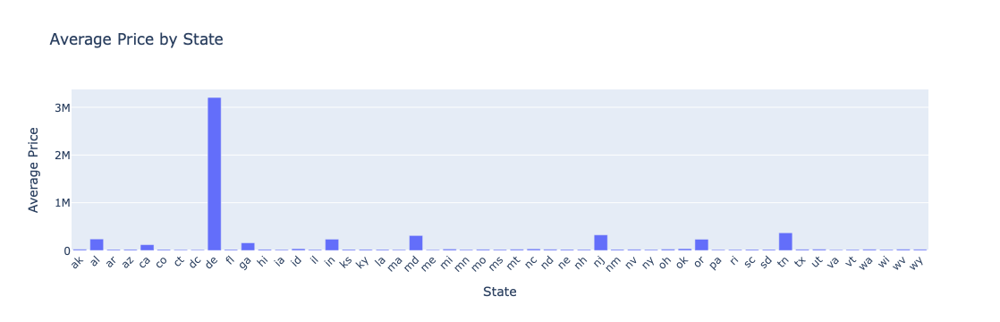

In [154]:
import pandas as pd
import math
import plotly.express as px

# Define categories to analyze
categories_of_interest = ['manufacturer', 'condition', 'cylinders', 'title_status', 
                       'transmission', 'drive', 'size', 'type', 'state']

print("STEP 3 -- Explore non-numeric data, look for outliers and possible errors:\n")

# Explore non-numeric columns
print("\nUnique Values for Non-Numeric Columns:\n")
for column in df.select_dtypes(include=['object', 'category']).columns:
    unique_values = df[column].unique()
    print(f"{column}: {unique_values[:10]} ... ({len(unique_values)} unique values)")

# Display distribution of prices
price_dist = px.histogram(df, x='price', nbins=100, title="Distribution of Car Prices", 
                          labels={'price': 'Price'})
price_dist.update_layout(bargap=0.2)  # space between bars
price_dist.show()

# Cycle through categorical columns and display average price graphs
for column in categories_of_interest:
    avg_price = df.groupby(column, as_index=False)['price'].mean()
    fig_avg_price = px.bar(avg_price, x=column, y='price',
                               title=f"Average Price by {column.capitalize()}",
                               labels={'price': 'Average Price', column: column.capitalize()})
        
    fig_avg_price.update_layout(xaxis_tickangle=-45)
    fig_avg_price.show()


In [155]:
print("STEP 3 -- Continue looking for outliers and possible errors:\n")
df_sorted = df.sort_values(by='price', ascending=False)[['price', 'year', 'manufacturer']]
df_ferrari = df[df['manufacturer'] == 'ferrari'].sort_values(by='price', ascending=False)[['price', 'year', 'manufacturer']]
print("All cars sorted by price:")
print(df_sorted.head(20))
print("\nFerrari cars sorted by price:")
print(df_ferrari.head(20))
df_sorted = df_sorted[df_sorted['price'] <= 200000]
print("Cars below $1M sorted by price:")
print(df_sorted.head(20))

STEP 3 -- Continue looking for outliers and possible errors:

All cars sorted by price:
             price  year   manufacturer
318592  3736928711  2007         toyota
356716  3736928711  1999         toyota
257840  3024942282  2000  mercedes-benz
91576   3024942282  2000  mercedes-benz
37410   3009548743  2021      chevrolet
184704  1410065407  1989           jeep
153082  1234567890  2006          volvo
29386   1111111111  1999           ford
37409   1111111111  2020           jeep
122470   987654321  1960      chevrolet
280      987654321  1960      chevrolet
230753   135008900  2008         nissan
193736   123456789  2015      chevrolet
288356   123456789  1965      chevrolet
307488   123456789  1996            gmc
358555   123456789  2021            NaN
137807   123456789  1999          buick
207080   123456789  2003            NaN
241404   113456789  1980            bmw
1838      99999999  1993           ford

Ferrari cars sorted by price:
         price  year manufacturer
360604 

### Data Preparation - CODE AND OUTPUT

Drop data and re-examine



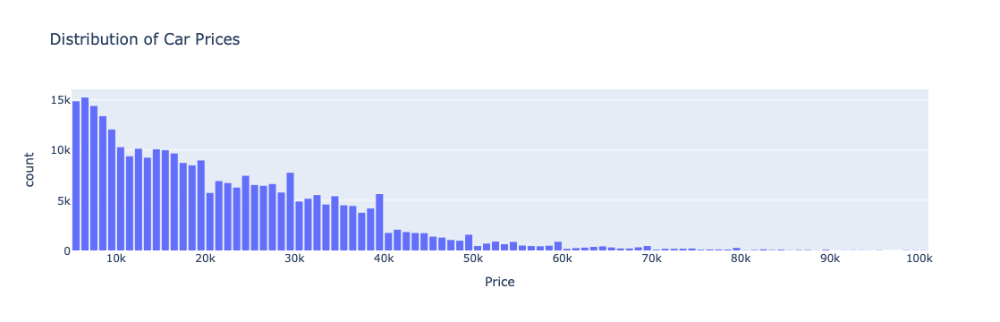

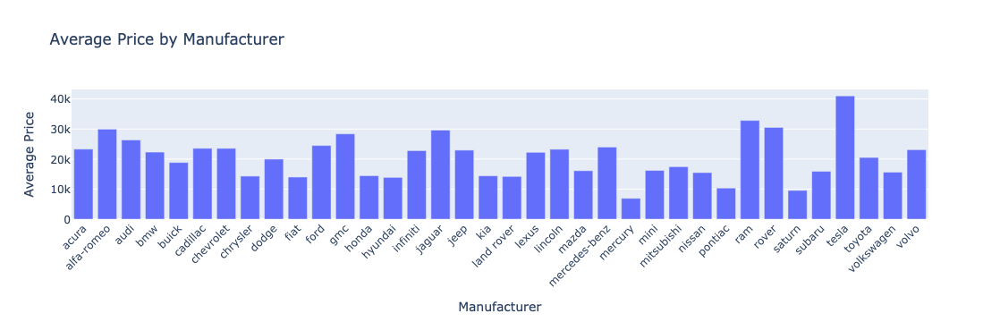

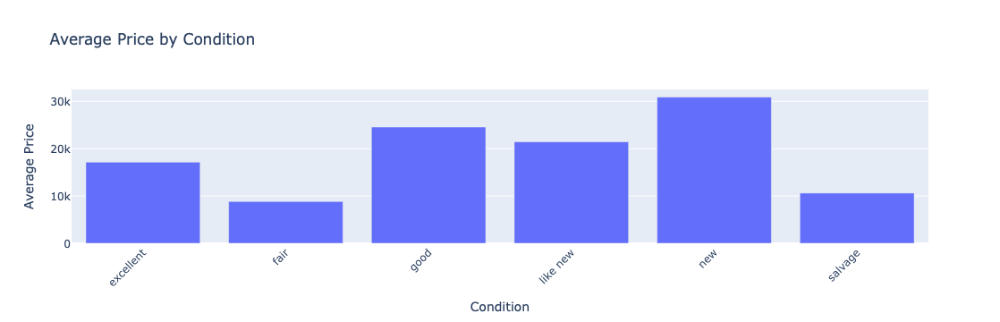

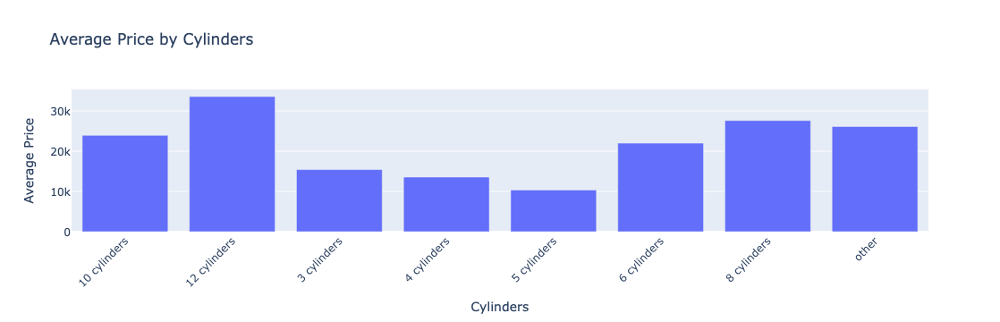

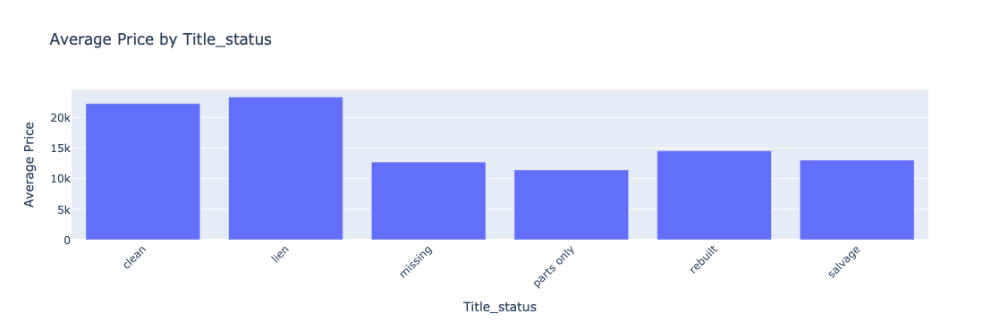

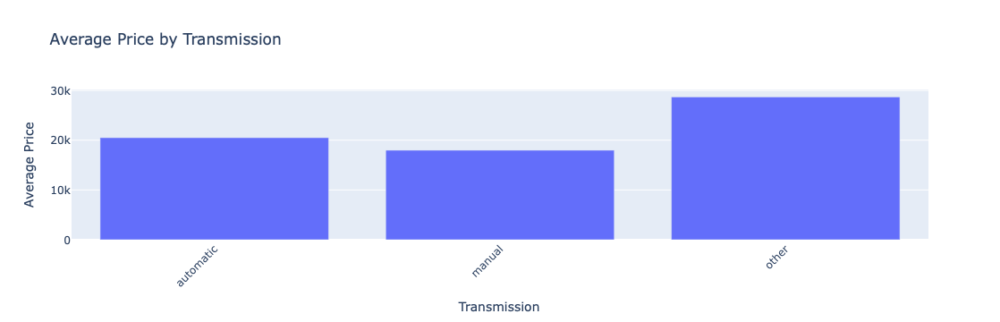

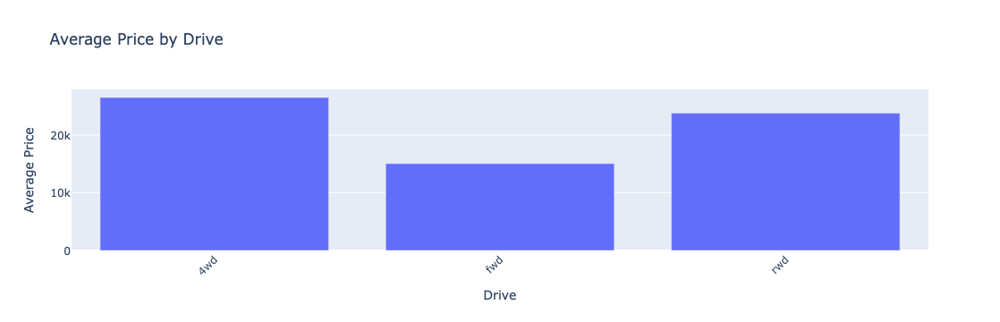

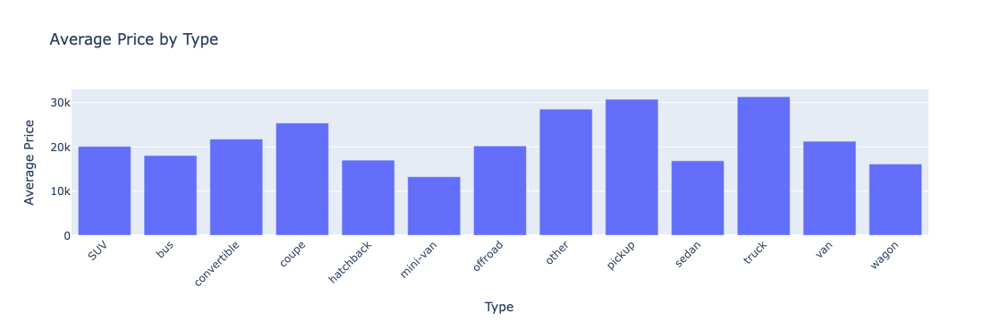

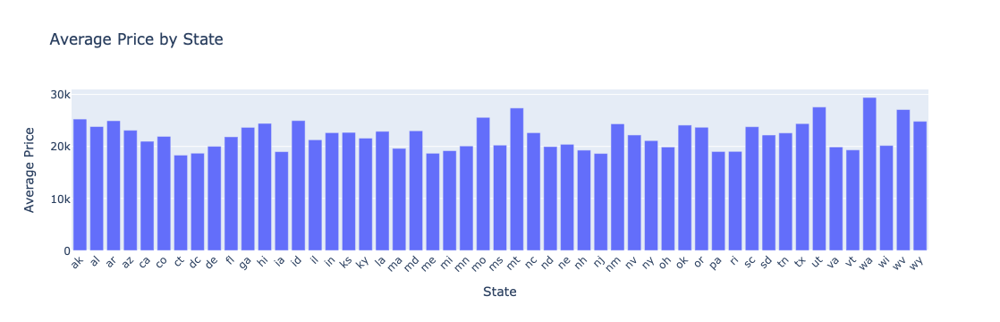

In [159]:
# Drop columns we don't intend to analyze, assigning result to a new dataframe for non-destructive editing

High_Price_Limit = 100000
Low_Price_Limit = 5000
High_Mileage_Limit = 200000
Low_Year_Limit = 1990
brands_to_remove = ['aston-martin', 'harley-davidson', 'porsche', 'ferrari']
categories_of_interest = ['manufacturer', 'condition', 'cylinders', 'title_status', 
                       'transmission', 'drive', 'type', 'state']

print("Drop data and re-examine\n")
analysis_df = df.drop(columns=['id', 'region', 'VIN', 'model', 'size'])

# Drop outliers
analysis_df = analysis_df[(analysis_df['price'] <= High_Price_Limit) & (analysis_df['price'] >= Low_Price_Limit) & (analysis_df['odometer'] <= High_Mileage_Limit) & (analysis_df['year'] >= Low_Year_Limit)]

# Drop brands_to_remove 
analysis_df = analysis_df[~analysis_df['manufacturer'].isin(brands_to_remove)]

# Display distribution of prices
price_dist = px.histogram(analysis_df, x='price', nbins=100, title="Distribution of Car Prices", 
                          labels={'price': 'Price'})
price_dist.update_layout(bargap=0.2)  # space between bars
price_dist.show()

# Cycle through categorical columns and display average price graphs
for column in categories_of_interest:
    avg_price = analysis_df.groupby(column, as_index=False)['price'].mean()
    fig_avg_price = px.bar(avg_price, x=column, y='price',
                               title=f"Average Price by {column.capitalize()}",
                               labels={'price': 'Average Price', column: column.capitalize()})
        
    fig_avg_price.update_layout(xaxis_tickangle=-45)
    fig_avg_price.show()


In [161]:
from sklearn.preprocessing import StandardScaler

print("Standardize and drop missing values.\n")
# Identify numerical and categorical columns
categorical_columns = analysis_df.select_dtypes(exclude=['number']).columns
numerical_columns = analysis_df.select_dtypes(include=['number']).columns

# Create a new data set with median/mode replacing missing values, to check later
nomissing_df = analysis_df.copy()
nomissing_df[categorical_columns] = nomissing_df[categorical_columns].apply(lambda x: x.fillna(x.mode()[0]))
nomissing_df[numerical_columns] = nomissing_df[numerical_columns].fillna(nomissing_df[numerical_columns].median())

# Drop records with missing values
analysis_df = analysis_df.dropna()
#analysis_df = nomissing_df # Uncomment to use the nomissing df instead

# One-shot encode categorical columns and and scale numerical columns
analysis_df = pd.get_dummies(analysis_df, columns=categorical_columns, drop_first=True)
scaler = StandardScaler() 
analysis_df[numerical_columns] = scaler.fit_transform(analysis_df[numerical_columns])

pd.options.display.float_format = '{:.2f}'.format
print(analysis_df.describe())


Standardize and drop missing values.

         price     year  odometer
count 83442.00 83442.00  83442.00
mean      0.00    -0.00      0.00
std       1.00     1.00      1.00
min      -1.12    -4.26     -1.76
25%      -0.81    -0.45     -0.87
50%      -0.34     0.13      0.02
75%       0.68     0.70      0.76
max       6.35     1.84      2.17


### Modeling - CODE AND OUTPUT

First, let's do a quick, rough correlation heatmap of numerical features.



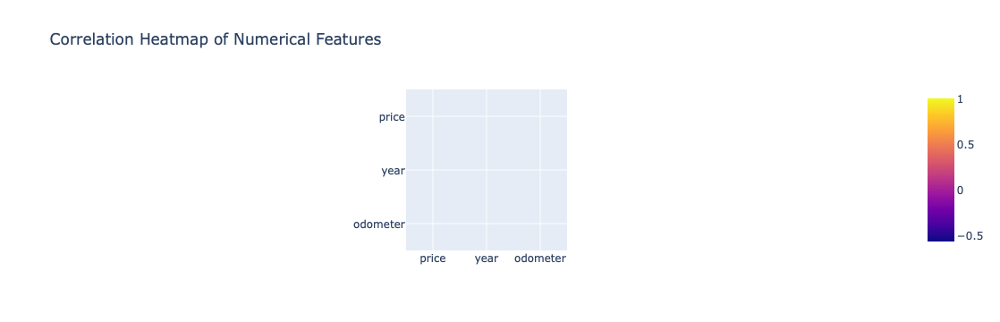

Now a similar heatmap of non-numerical features.



In [165]:
import pandas as pd
import numpy as np
import plotly.express as px
from scipy.stats import chi2_contingency

# Identify numerical and categorical columns
numerical_columns = analysis_df.select_dtypes(include=['number']).columns
categorical_columns = analysis_df.select_dtypes(exclude=['number']).columns

print("First, let's do a quick, rough correlation heatmap of numerical features.\n")
# Show a correlation matrix for numerical columns
corr_matrix = analysis_df[numerical_columns].corr()
fig_corr = px.imshow(corr_matrix, title="Correlation Heatmap of Numerical Features")
fig_corr.show()

print("Now a similar heatmap of non-numerical features.\n")
# Function to compute Cramer's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# Compute Cramér's V correlation against 'price'
correlations = {}
for col in categorical_columns:
    correlations[col] = cramers_v(analysis_df[col], analysis_df['price'])

# Convert to DataFrame
corr_df = pd.DataFrame(correlations.items(), columns=['Feature', "Cramer's V"]).sort_values(by="Cramer's V", ascending=False)

# Create a larger bar plot
fig_cramers = px.bar(corr_df, 
                     x="Feature", 
                     y="Cramer's V", 
                     title="Cramer's V Correlation of Categorical Features with Price",
                     labels={"Cramer's V": "Correlation Strength"},
                     color="Cramer's V",
                     color_continuous_scale="Blues",
                     width=1200,  # Increased width
                     height=800)   # Increased height

fig_cramers.show()

In [167]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

print("Let's now test various models to see which one performs best.\n")

# Features and target
X = analysis_df.drop(columns=['price'])  
y = analysis_df['price']  

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define Regression Models & Parameters
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor()
}

# Hyperparameters for GridSearchCV
param_grid = {
    "Ridge Regression": {"alpha": [0.1, 1.0, 10.0]},
    "Decision Tree": {"max_depth": [5, 10, 20], "min_samples_split": [2, 5, 10]},
    "Random Forest": {"n_estimators": [50, 100, 200], "max_depth": [5, 10, 20]},
    "Gradient Boosting": {"n_estimators": [50, 100, 200], "learning_rate": [0.01, 0.1, 0.2]}
}

# Train & Evaluate Models
results = {}
feature_importances = {}

for name, model in models.items():
    print(f"\nTraining {name}...")
    
    # Apply GridSearchCV if hyperparameters exist
    if name in param_grid:
        grid_search = GridSearchCV(model, param_grid[name], cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        print(f"Best Params for {name}: {grid_search.best_params_}")
    else:
        best_model = model
        best_model.fit(X_train, y_train)

    # Predictions
    y_pred = best_model.predict(X_test)
    
    # Cross-validation score
    cv_score = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
    
    # Evaluation metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"{name} - RMSE: {rmse:.2f}, MAE: {mae:.2f}, R²: {r2:.4f}, Cross-validation R²: {cv_score.mean():.4f}")
    
    results[name] = {"RMSE": rmse, "MAE": mae, "R²": r2, "CV R²": cv_score.mean()}

    # Extract feature importances for models that support it
    if hasattr(best_model, "feature_importances_"):
        importances = best_model.feature_importances_
        feature_importance_df = pd.DataFrame({"Feature": X.columns, "Importance": importances})
        feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)
        feature_importances[name] = feature_importance_df
        
        # Print the top 10 most important features
        print(f"\nTop 10 Feature Importances for {name}:\n")
        print(feature_importance_df.head(10))

# Compare Model Performance
results_df = pd.DataFrame(results).T
print("\nSummary:\n")
print(results_df.sort_values(by="R²", ascending=False))


Let's now test various models to see which one performs best.


Training Linear Regression...
Linear Regression - RMSE: 0.49, MAE: 0.34, R²: 0.7574, Cross-validation R²: 0.7648

Training Ridge Regression...
Best Params for Ridge Regression: {'alpha': 1.0}
Ridge Regression - RMSE: 0.49, MAE: 0.34, R²: 0.7574, Cross-validation R²: 0.7648

Training Decision Tree...
Best Params for Decision Tree: {'max_depth': 20, 'min_samples_split': 10}
Decision Tree - RMSE: 0.37, MAE: 0.20, R²: 0.8625, Cross-validation R²: 0.8483

Top 10 Feature Importances for Decision Tree:

                  Feature  Importance
0                    year        0.43
44  cylinders_4 cylinders        0.12
1                odometer        0.11
47  cylinders_8 cylinders        0.09
50               fuel_gas        0.05
60              drive_fwd        0.04
38         condition_good        0.01
71             type_truck        0.01
61              drive_rwd        0.01
59     transmission_other        0.01

Training Random

In [141]:
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectFromModel
import numpy as np
import pandas as pd

print("Let's now see if we can further improve the best model with polynomial features.\n")

# Define the features (ensure price is excluded from the features)
features = [col for col in analysis_df.columns if col != 'price']

# Generate Polynomial Features excluding 'price' column
print("Generating Polynomial Features...\n")
poly = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)
X_poly = poly.fit_transform(analysis_df[features])

# Scale the features
scaler = StandardScaler()
X_poly_scaled = scaler.fit_transform(X_poly)

# Train a Random Forest to get feature importances
rf = RandomForestRegressor(n_estimators=200, max_depth=20, random_state=42)
rf.fit(X_poly_scaled, analysis_df['price'])

# Feature importances from the Random Forest model
importances = rf.feature_importances_

# Map the importances to feature names
feature_names = poly.get_feature_names_out(input_features=features)

# Create a DataFrame to view features and their importances
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

# Sort the features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the top 10 most important features
print("Top 10 Polynomial Feature Importances:\n")
print(feature_importance_df.head(10))

# Use SelectFromModel to select important features based on feature importance
sfm = SelectFromModel(rf, threshold="mean")  # Select features with importance above the mean
X_poly_selected = sfm.transform(X_poly_scaled)

# Split data into training and testing sets using selected features
X_train, X_test, y_train, y_test = train_test_split(X_poly_selected, analysis_df['price'], test_size=0.2, random_state=42)

# Train Random Forest on the selected polynomial features
print("Training Random Forest on Selected Polynomial Features...\n")
rf_selected = RandomForestRegressor(n_estimators=200, max_depth=20, random_state=42)
rf_selected.fit(X_train, y_train)

# Make predictions
y_pred = rf_selected.predict(X_test)

# Evaluate the model
rmse = root_mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Cross-validation to assess generalization
cv_r2 = cross_val_score(rf_selected, X_poly_selected, analysis_df['price'], cv=5, scoring='r2').mean()

print(f"Random Forest with Feature Selection - RMSE: {rmse:.4f}, MAE: {MAE:.4f}, R²: {r2:.4f}, CV R²: {cv_r2:.4f}")


Let's now see if we can further improve the best model with polynomial features.

Generating Polynomial Features...

Top 10 Polynomial Feature Importances:

                             Feature  Importance
0                               year      0.1830
1                           odometer      0.1465
190       year cylinders_8 cylinders      0.1155
331                odometer fuel_gas      0.0592
140                    year odometer      0.0448
5689  cylinders_4 cylinders fuel_gas      0.0424
325   odometer cylinders_4 cylinders      0.0272
189       year cylinders_6 cylinders      0.0263
328   odometer cylinders_8 cylinders      0.0225
64                         drive_fwd      0.0221
Training Random Forest on Selected Polynomial Features...

Random Forest with Feature Selection - RMSE: 0.3120, R²: 0.9032, CV R²: 0.8721


Focus on just vehicles in the state of ca of type ['pickup', 'truck'].



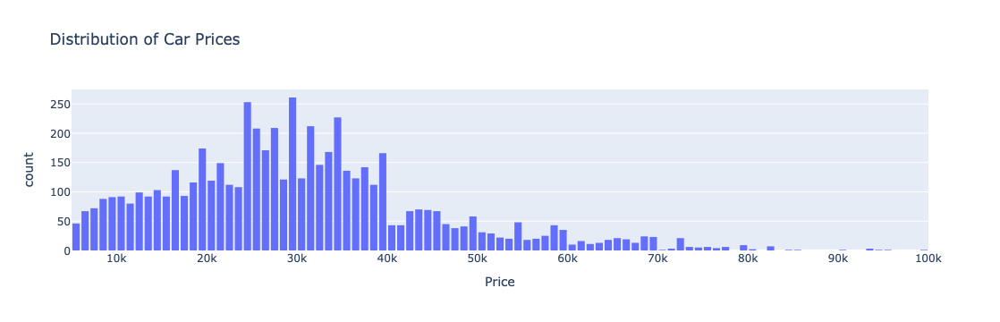

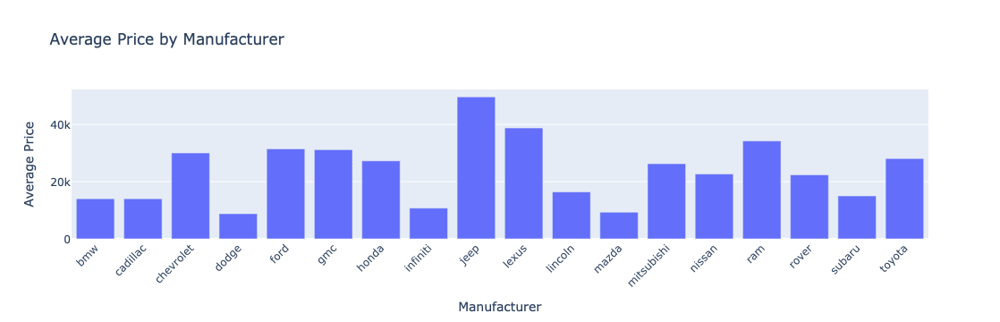

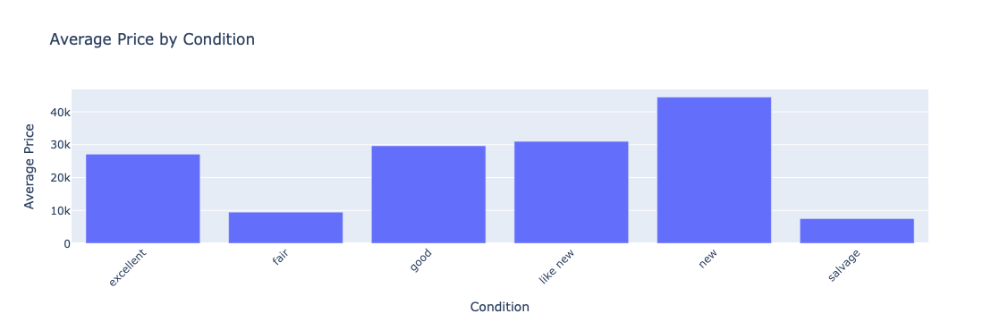

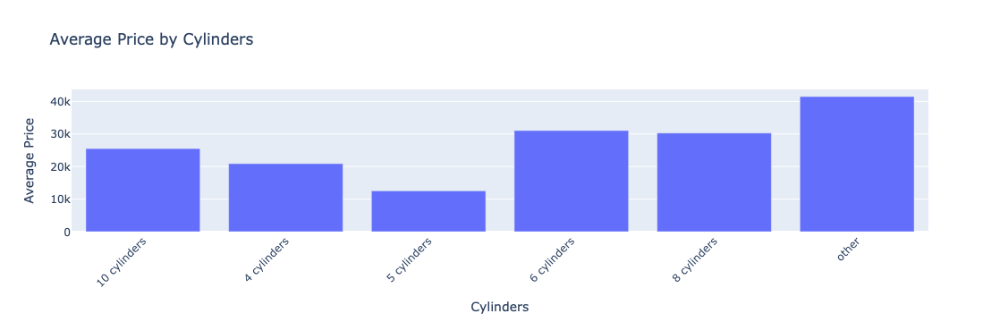

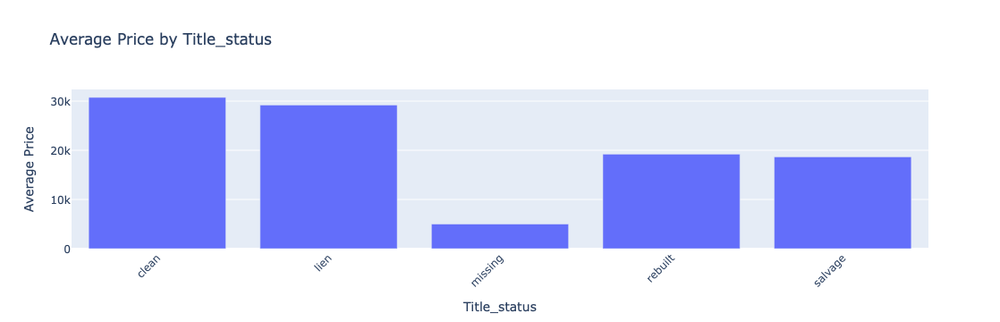

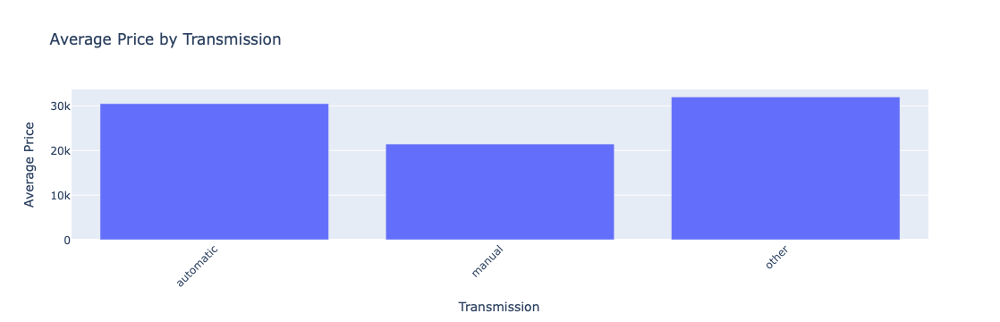

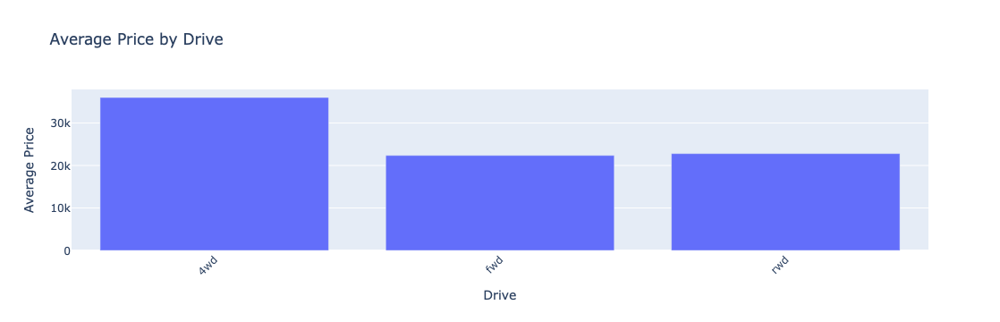

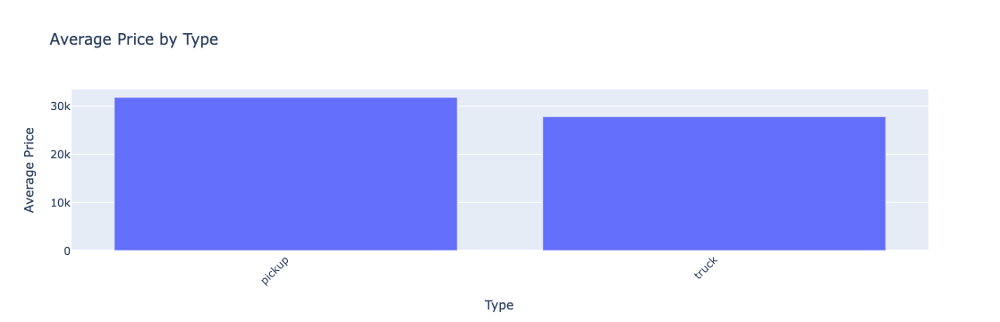

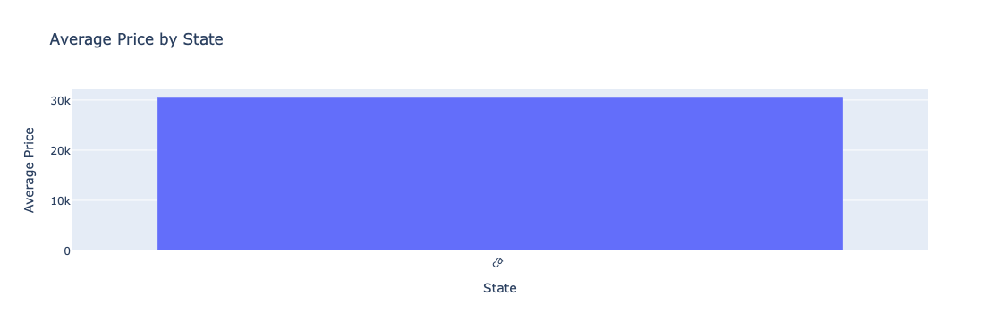

         price    year  odometer
count  5787.00 5787.00   5787.00
mean  30516.07 2012.81  83338.34
std   14543.21    5.59  53362.23
min    5000.00 1990.00      0.00
25%   20000.00 2010.00  36284.00
50%   29450.00 2014.00  79630.00
75%   37950.00 2017.00 123359.50
max   99700.00 2021.00 200000.00


In [192]:
# Focus on a subset

High_Price_Limit = 100000
Low_Price_Limit = 5000
High_Mileage_Limit = 200000
Low_Year_Limit = 1990
brands_to_remove = ['aston-martin', 'harley-davidson', 'porsche', 'ferrari']
categories_of_interest = ['manufacturer', 'condition', 'cylinders', 'title_status', 
                       'transmission', 'drive', 'type', 'state']
state_of_interest = 'ca'
type_of_interest = ['pickup','truck']

print(f"Focus on just vehicles in the state of {state_of_interest} of type {type_of_interest}.\n")
subset_analysis_df = df.drop(columns=['id', 'region', 'VIN', 'model', 'size'])

# Drop outliers
subset_analysis_df = subset_analysis_df[(subset_analysis_df['price'] <= High_Price_Limit) & (subset_analysis_df['price'] >= Low_Price_Limit) & (subset_analysis_df['odometer'] <= High_Mileage_Limit) & (subset_analysis_df['year'] >= Low_Year_Limit)]

# Drop brands_to_remove 
subset_analysis_df = subset_analysis_df[~subset_analysis_df['manufacturer'].isin(brands_to_remove)]

# Drop to state and car type of interest
subset_analysis_df = subset_analysis_df[(subset_analysis_df['state'] == 'ca')]
subset_analysis_df = subset_analysis_df[subset_analysis_df['type'].isin(type_of_interest)]

# Display distribution of prices
price_dist = px.histogram(subset_analysis_df, x='price', nbins=100, title="Distribution of Car Prices", 
                          labels={'price': 'Price'})
price_dist.update_layout(bargap=0.2)  # space between bars
price_dist.show()

# Cycle through categorical columns and display average price graphs
for column in categories_of_interest:
    avg_price = subset_analysis_df.groupby(column, as_index=False)['price'].mean()
    fig_avg_price = px.bar(avg_price, x=column, y='price',
                               title=f"Average Price by {column.capitalize()}",
                               labels={'price': 'Average Price', column: column.capitalize()})
        
    fig_avg_price.update_layout(xaxis_tickangle=-45)
    fig_avg_price.show()

pd.options.display.float_format = '{:.2f}'.format
print(subset_analysis_df.describe())

In [196]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn.preprocessing import StandardScaler

print("Standardize and drop missing values.\n")
# Identify numerical and categorical columns
categorical_columns = subset_analysis_df.select_dtypes(exclude=['number']).columns
numerical_columns = subset_analysis_df.select_dtypes(include=['number']).columns

# Drop records with missing values
subset_analysis_df = subset_analysis_df.dropna()

# One-shot encode categorical columns and and scale numerical columns
subset_analysis_df = pd.get_dummies(subset_analysis_df, columns=categorical_columns, drop_first=True)
scaler = StandardScaler() 
subset_analysis_df[numerical_columns] = scaler.fit_transform(subset_analysis_df[numerical_columns])

pd.options.display.float_format = '{:.2f}'.format
print(subset_analysis_df.describe())

print("Let's now test various models to see which one performs best on the subset data.\n")

# Features and target
X = subset_analysis_df.drop(columns=['price'])  
y = subset_analysis_df['price']  

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define Regression Models & Parameters
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor()
}

# Hyperparameters for GridSearchCV
param_grid = {
    "Ridge Regression": {"alpha": [0.1, 1.0, 10.0]},
    "Decision Tree": {"max_depth": [5, 10, 20], "min_samples_split": [2, 5, 10]},
    "Random Forest": {"n_estimators": [50, 100, 200], "max_depth": [5, 10, 20]},
    "Gradient Boosting": {"n_estimators": [50, 100, 200], "learning_rate": [0.01, 0.1, 0.2]}
}

# Train & Evaluate Models
results = {}
feature_importances = {}

for name, model in models.items():
    print(f"\nTraining {name}...")
    
    # Apply GridSearchCV if hyperparameters exist
    if name in param_grid:
        grid_search = GridSearchCV(model, param_grid[name], cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        print(f"Best Params for {name}: {grid_search.best_params_}")
    else:
        best_model = model
        best_model.fit(X_train, y_train)

    # Predictions
    y_pred = best_model.predict(X_test)
    
    # Cross-validation score
    cv_score = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
    
    # Evaluation metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"{name} - RMSE: {rmse:.2f}, MAE: {mae:.2f}, R²: {r2:.4f}, Cross-validation R²: {cv_score.mean():.4f}")
    
    results[name] = {"RMSE": rmse, "MAE": mae, "R²": r2, "CV R²": cv_score.mean()}

    # Extract feature importances for models that support it
    if hasattr(best_model, "feature_importances_"):
        importances = best_model.feature_importances_
        feature_importance_df = pd.DataFrame({"Feature": X.columns, "Importance": importances})
        feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)
        feature_importances[name] = feature_importance_df
        
        # Print the top 10 most important features
        print(f"\nTop 10 Feature Importances for {name}:\n")
        print(feature_importance_df.head(10))

# Compare Model Performance
results_df = pd.DataFrame(results).T
print("\nSummary:\n")
print(results_df.sort_values(by="R²", ascending=False))


Standardize and drop missing values.

        price    year  odometer
count 2049.00 2049.00   2049.00
mean     0.00   -0.00     -0.00
std      1.00    1.00      1.00
min     -1.59   -3.62     -1.75
25%     -0.78   -0.77     -0.90
50%     -0.04    0.24      0.04
75%      0.61    0.74      0.85
max      5.09    1.58      1.92
Let's now test various models to see which one performs best on the subset data.


Training Linear Regression...
Linear Regression - RMSE: 0.54, MAE: 0.38, R²: 0.7152, Cross-validation R²: 0.7569

Training Ridge Regression...
Best Params for Ridge Regression: {'alpha': 1.0}
Ridge Regression - RMSE: 0.54, MAE: 0.38, R²: 0.7151, Cross-validation R²: 0.7576

Training Decision Tree...
Best Params for Decision Tree: {'max_depth': 20, 'min_samples_split': 2}
Decision Tree - RMSE: 0.54, MAE: 0.26, R²: 0.7168, Cross-validation R²: 0.7822

Top 10 Feature Importances for Decision Tree:

                  Feature  Importance
0                    year        0.44
1             

### PRESENTATION

Run this code to do initial data analysis for the presentation.

In [320]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

High_Price_Limit = 100000
Low_Price_Limit = 5000
High_Mileage_Limit = 200000
Low_Year_Limit = 1990
brands_to_remove = ['aston-martin', 'harley-davidson', 'porsche', 'ferrari']
categories_of_interest = ['manufacturer', 'condition', 'cylinders', 'title_status', 
                       'transmission', 'drive', 'type', 'state']
state_of_interest = 'ca'
type_of_interest = ['pickup','truck']

#
# Re-usable routine to perform car price dataset analysis
#
def analyze_car_prices(df):
    # Identify numerical and categorical columns
    categorical_columns = df.select_dtypes(exclude=['number']).columns
    numerical_columns = df.select_dtypes(include=['number']).columns

    # One-shot encode categorical columns and scale numerical columns
    df = pd.get_dummies(df, columns=categorical_columns, drop_first=True)
    scaler = StandardScaler()
    df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

    # Features and target
    X = df.drop(columns=['price'])  
    y = df['price']  

    # Train-Test Split
    print("Splitting data.")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize Random Forest model with fixed parameters
    print("Fitting model.")
    best_model = RandomForestRegressor(max_depth=20, n_estimators=200, random_state=42)
    best_model.fit(X_train, y_train)

    # Predictions
    print("Making predictions.")
    y_pred = best_model.predict(X_test)

    # Cross-validation score
    print("Cross validating.")
    cv_score = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')

    # Evaluation metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Retrieve original price mean and standard deviation
    price_mean = scaler.mean_[numerical_columns.get_loc('price')]
    price_std = np.sqrt(scaler.var_[numerical_columns.get_loc('price')])

    # Convert RMSE and MAE back to original price scale
    rmse_original = rmse * price_std
    mae_original = mae * price_std

    print(f"Random Forest - RMSE: {rmse_original:.2f}, MAE: {mae_original:.2f}, R²: {r2:.4f}, Cross-validation R²: {cv_score.mean():.4f}")

    # Extract feature importances
    importances = best_model.feature_importances_
    feature_importance_df = pd.DataFrame({"Feature": X.columns, "Importance": importances})
    feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

    # Print the top 10 most important features
    print("\nTop 10 Feature Importances for Random Forest:\n")
    print(feature_importance_df.head(10))

    # Compute correlation of each feature with price
    correlations = df.corr()["price"].sort_values(ascending=False)

    # Filter correlations above 0.3 or below -0.3 and remove the correlation with itself (price)
    filtered_correlations = correlations[(correlations > 0.3) | (correlations < -0.3)]
    filtered_correlations = filtered_correlations.drop("price")
    
    # Count the total number of features in filtered_correlations and display top
    correlated_features = len(filtered_correlations)
    print(f"Total correlations stronger than 0.3: {correlated_features}.")
    print("\nTop positively correlated features (increase price):")
    print(filtered_correlations[filtered_correlations > 0].head(10))  # Top positive correlations
    print("\nTop negatively correlated features (decrease price):")
    print(filtered_correlations[filtered_correlations < 0].head(10))  # Top negative correlations

    return best_model, feature_importance_df, rmse_original, mae_original, r2, cv_score.mean()

#
# Create two datasets, the main dataset and a subset
#

# Load the dataset
file_path = "vehicles.csv"
final_df = pd.read_csv(file_path)
initial_length = len(final_df)
print(f"Our initial dataset included {initial_length} records of used car sales.")

# Drop unused columns
final_df = final_df.drop(columns=['id', 'region', 'VIN', 'model', 'size'])

# Drop outliers
final_df = final_df[(final_df['price'] <= High_Price_Limit) & (final_df['price'] >= Low_Price_Limit) & (final_df['odometer'] <= High_Mileage_Limit) & (final_df['year'] >= Low_Year_Limit)]

# Drop brands_to_remove 
final_df = final_df[~final_df['manufacturer'].isin(brands_to_remove)]

# Drop records with missing values
final_df = final_df.dropna()

# Create subset df
subset_final_df = final_df[(final_df['state'] == 'ca')]
subset_final_df = subset_final_df[subset_final_df['type'].isin(type_of_interest)]

print(f"After data clean up and processing, we were left with {len(final_df)} records.")

#
# Run the routine on both datasets
#

print("\nAnalyzing full dataset (final_df):")
final_model, final_feature_importance, final_rmse, final_mae, final_r2, final_cv_score = analyze_car_prices(final_df)

# Run analysis on subset_final_df
print("\nAnalyzing subset dataset (subset_final_df):")
subset_model, subset_feature_importance, subset_rmse, subset_mae, subset_r2, subset_cv_score = analyze_car_prices(subset_final_df)


Our initial dataset included 426880 records of used car sales.
After data clean up and processing, we were left with 83442 records.

Analyzing full dataset (final_df):
Splitting data.
Fitting model.
Making predictions.
Cross validating.
Random Forest - RMSE: 3772.01, MAE: 2078.63, R²: 0.9114, Cross-validation R²: 0.9044

Top 10 Feature Importances for Random Forest:

                  Feature  Importance
0                    year        0.38
1                odometer        0.16
44  cylinders_4 cylinders        0.12
47  cylinders_8 cylinders        0.08
50               fuel_gas        0.05
60              drive_fwd        0.04
71             type_truck        0.01
38         condition_good        0.01
61              drive_rwd        0.01
59     transmission_other        0.01
Total correlations stronger than 0.3: 6.

Top positively correlated features (increase price):
year                    0.52
transmission_other      0.43
cylinders_8 cylinders   0.33
Name: price, dtype: float64

T

Run this code to display the presentation.

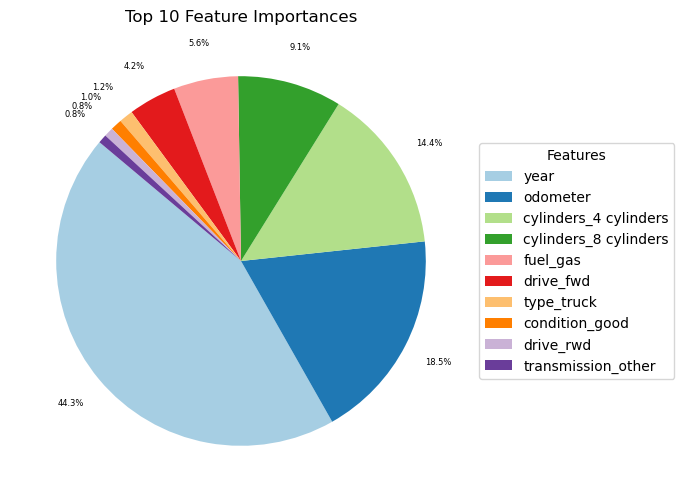

In [328]:
from IPython.display import display, HTML

# Properly format lists
brands_text = ", ".join(brands_to_remove) if isinstance(brands_to_remove, list) else brands_to_remove

# Display presentation
display(HTML('<p style="font-family:Courier; font-size:40px;">Used Car Pricing Analysis</p>'))

display(HTML('<p style="font-family:Courier; font-size:18px;">'
             'Thank you for employing us at Module 11 Analytics, Inc. Today we are pleased to deliver '
             'an overview of our used car pricing analysis, aiming to help you better predict the factors '
             'driving pricing for your current and future used car inventory.'
             '</p>'))
display(HTML('<p> </p>'))
display(HTML(f'<p style="font-family:Courier; font-size:18px;">'
             f'Our overall dataset we relied on contained {initial_length:,} records of used car prices. '
             f'We eliminated cars priced less than \\${Low_Price_Limit:,} or more than \\${High_Price_Limit:,} from the analysis, '
             f'as well as cars older than {Low_Year_Limit} model year.  We also eliminated cars from the brands {brands_text}. '
             f'Finally, we eliminated records with missing values. '
             f'After data clean-up and processing, we were left with {len(final_df):,} records.'
             f'</p>'))
display(HTML('<p style="font-family:Courier; font-size:18px;">'
             'We then performed statistical analysis on these remaining car sales figures, to determine what features had the '
             'most effect on pricing. Here is how the relative importance of the top 10 feaures breaks down: '
             '</p>'))
display(HTML('<p style="font-family:Courier; font-size:18px;">'
             '</p>'))

# Extract top 10 features
top_10 = final_feature_importance.head(10)

# Create figure and pie chart, then display
fig, ax = plt.subplots(figsize=(10, 6))
wedges, _, autotexts = ax.pie(
    top_10["Importance"], labels=None, autopct='%1.1f%%', 
    startangle=140, colors=plt.cm.Paired.colors, pctdistance=1.2,  # Moves percentage labels outward
    textprops={'fontsize': 6}  # Adjust text size
)
plt.title("Top 10 Feature Importances")
plt.legend(wedges, top_10["Feature"], title="Features", loc="center left", bbox_to_anchor=(1, 0.5))
plt.show()

display(HTML('<p style="font-family:Courier; font-size:18px;">'
             'As this pie chart reflects, the most predictively important features were car year, odometer reading, the number of '
             'cylinders, and the fuel type. Importance has a particular statistical meaning here, but a high level what this reports on is '
             'which factors have the most power in reducing predictive uncertainty.  It does not tell us what features drive a price up or '
             'down, though -- just predictive power.'
             '</p>'))
display(HTML('<p style="font-family:Courier; font-size:18px;">'
             'To identify features that drive price up or down, we look at correlations.  We were able to identify six such features -- '
             'three that often drive price up, and three that often drove price down:'
             '</p>'))
display(HTML('<p style="font-family:Courier; font-size:18px;">'
             'Factors driving price upwards are a higher model year, electric car transmission type, and the presence of 8 cylinders. '
             'Factors driving price downward are a higher odometer reading, front wheel drive transmission type, and the presence of 4 cylinders.'           
             '</p>'))
display(HTML(f'<p style="font-family:Courier; font-size:18px;">'
             f'In the end we used these and other importance features to design an algorithm to predict car pricing. '
             f'We are pleased to say that we can predict car pricing within on average \\${final_mae:,.0f} - \\${final_rmse:,.0f}.'
             f'</p>'))
display(HTML(f'<p style="font-family:Courier; font-size:18px;">'
             f'As a follow up to this initial analysis, we are happy to perform more detailed analysis on any subset of the data that '
             f'you believe would be worthwhile to concentrate on.  For example, we have focused on sales of used pick-ups and trucks in California.'
             f'We have determined for such vehicles, rear wheel drive transmission type, and gas fuelling (as opposed to diesel or electric) drive '
             f'prices down.  We have developed an algorithm specific to these CA trucks are are able to predict price within '
             f'\\${subset_mae:,.0f} - \\${subset_rmse:,.0f}.'
             f'</p>'))
